In [0]:
#查看显卡型号
!nvidia-smi

In [0]:
# 现在默认的tensorflow的版本为2.x。本教程为1.x
# 所以将tensorflow的版本改为1.x
%tensorflow_version 1.x
import tensorflow as tf
print('tensorFlow version:',tf.__version__)

In [0]:
# 下载数据集和YOLO_small.ckpt
!git clone https://github.com/chentinghao/download_google_drive.git
%cd download_google_drive/
!python download_gdrive.py 1o8WQoURDef7xm_1L6iJeqal3VpKSS-Xg YOLO_small.ckpt
!python download_gdrive.py 1-ArlUg8_24BivOxlDAtjYQfw_Nj4ZC2h VOCtest_06-Nov-2007.tar
!python download_gdrive.py 1-6832aTpz_-kzTxrGTnpVPWH-6i0ObQy VOCtrainval_06-Nov-2007.tar
!python download_gdrive.py 176XdliZfMZklzYnnPR86BddGhgTLm8Kl VOCtrainval_11-May-2012.tar

!mv YOLO_small.ckpt ..
!mv VOCtest_06-Nov-2007.tar ..
!mv VOCtrainval_06-Nov-2007.tar ..
!mv VOCtrainval_11-May-2012.tar ..
%cd ..
!rm -rf download_google_drive

# 解压 
!tar xf VOCtrainval_11-May-2012.tar
!tar xf VOCtrainval_06-Nov-2007.tar
!tar xf VOCtest_06-Nov-2007.tar

fatal: destination path 'download_google_drive' already exists and is not an empty directory.
/content/download_google_drive
358MB [00:02, 146MB/s]
430MB [00:03, 140MB/s]
439MB [00:03, 117MB/s]
1.86GB [00:44, 45.2MB/s]
/content


In [0]:
#下载python文件
!git clone https://github.com/BITLiuYu/Yolov1_Tensorflow

In [0]:
#加载TensorBoard
import tensorflow as tf
tf.reset_default_graph()
# Load the TensorBoard notebook extension
%load_ext tensorboard
import datetime, os






Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
INFO:tensorflow:Restoring parameters from ./YOLO_small.ckpt
yolo.images: Tensor("Placeholder:0", shape=(?, 448, 448, 3), dtype=float32)
scores =  Tensor("mul_4:0", shape=(7, 7, 2, 20), dtype=float32)
scores =  Tensor("Reshape_3:0", shape=(98, 20), dtype=float32)
Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
[x, y, w, h] = [349, 240, 66, 140]
i = 0
classes i =  7
scores i =  0.71367157
[x, y, w, h] = [152, 292, 69, 126]
i = 1
classes i =  7
scores i =  0.42479435
[x, y, w, h] = [95, 206, 52, 146]
i = 2
classes i =  7
scores i =  0.26856992
[x, y, w, h] = [237, 220, 98, 169]
i = 3
classes i =  7
scores i =  0.20734856


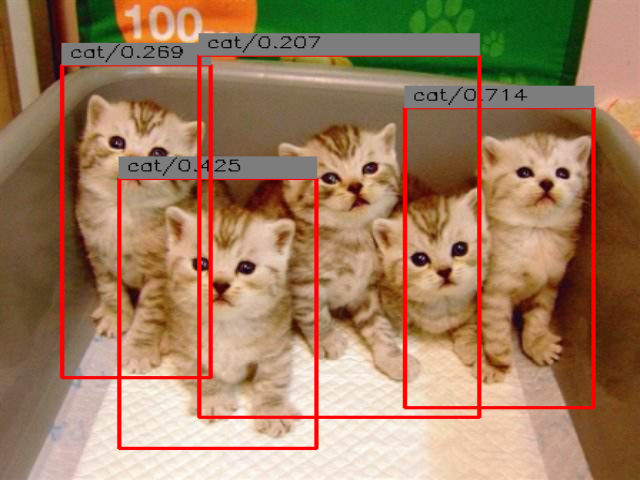

In [0]:
#@title
#Test网络
import tensorflow as tf
tf.reset_default_graph() #重置网络图

import numpy as np

import cv2
from google.colab.patches import cv2_imshow
from Yolov1_Tensorflow.yolov1.yolo_net import Yolo

!rm -rf logs

class Detector(object):

  def __init__(self, net):
    self.net = net
    self.classes = ["aeroplane", "bicycle", "bird", "boat", "bottle",
              "bus", "car", "cat", "chair", "cow", "diningtable",
              "dog", "horse", "motorbike", "person", "pottedplant",
              "sheep", "sofa", "train","tvmonitor"]
    self.num_len = len(self.classes) #物体类别数量
    #offset 偏移量
    self.x_offset = np.transpose(np.reshape(np.array([np.arange(7)] * 7 * 2), [2,7,7]), [1,2,0])
    self.y_offset = np.transpose(self.x_offset, [1,0,2]) #0 1 2 3 4 5 6
    self.threshold = 0.2 #confidence score
    self.iou_threshold = 0.5
    self.max_output_size = 10
    self.img_shape = (448,448)

  def interpret_output(self):
    prediction = self.net
    cls = tf.reshape(prediction[0, :7*7*20], [7, 7, 20])              #前20维是classes
    confidence = tf.reshape(prediction[0, 7*7*20 : 7*7*20 + 7*7*2], [7, 7, 2]) #然后两个是confidence
    
    
    '''每个边框由五个预测值组成：x,y,w,h,confidence。坐标（x,y） 代表了 bounding box 的中心与 grid cell 边界的相对值。
    width、height 则是相对于整幅图像的预测值(边框的宽和高)。
    注意：实际训练过程中，w和h的值使用图像的宽度和高度进行归一化到[0,1]区间内；
    x，y是bounding box中心位置相对于当前格子位置的偏移值，并且被归一化到[0,1]。'''
    boxes = tf.reshape(prediction[0, 7*7*20+7*7*2 :], [7,7,2,4])           #最后8个是x,y,w,h

    #true box = (x,y,w**2,h**2) 乘以图像的宽度和高度
    #给定一个形状为(A, B, C)的张量的长度 N 的列表；
    #如果 axis == 0，那么 output 张量将具有形状(N, A, B, C)。如果 axis == 1，那么 output 张量将具有形状(A, N, B, C)。
    #如果 axis == 2，那么 output 张量将具有形状(A, B, N, C)。如果 axis == 3，那么 output 张量将具有形状(A, B, C, N)。
    # offset变量用于把预测边界框predict_boxes中的坐标中心(x,y)由相对当前格子转换为相对当前整个图片
    # w，h的预测是平方根乘以图像的宽度和高度
    # https://blog.csdn.net/zhangjunp3/article/details/80421814
    # https://www.cnblogs.com/zyly/p/9534063.html
    # print('boxes的shape1：',boxes.shape) #(7, 7, 2, 4)
    # x_offset和y_offset都是(7, 7, 2)
    boxes = tf.stack(
        [
         (boxes[:,:,:,0] + tf.constant(self.x_offset,dtype=tf.float32)) / 7 * self.img_shape[0],  #x
         (boxes[:,:,:,1] + tf.constant(self.y_offset,dtype=tf.float32)) / 7 * self.img_shape[1],  #y 
         tf.square(boxes[:,:,:,2]) * self.img_shape[0],                         #width
         tf.square(boxes[:,:,:,3]) * self.img_shape[1],                         #height  
        ],axis=3
    ) # 4 个7*7*2*1的tensor按照第四个轴stack拼接在一起就变成7*7*2*4了
    # print('box的shape：',boxes.shape) #(7, 7, 2, 4)

    #这里的tensor相乘应该是一个高级写法
    ##在测试时，乘以条件类概率和单个盒子的置信度预测，这些分数编码了j类出现在框i中的概率以及预测框拟合目标类别的程度。
    #[7,7,2,20] 如果第i个边界框检测到类别j 则[;,;,i,j]=1
    scores = tf.expand_dims(confidence, 3) * tf.expand_dims(cls,2)  #tensor * 要求矩阵的形状必须一致(或者是其中一个维度为1)，否则会报错：
    # print('tf.expand_dims(confidence, -1) : ',tf.expand_dims(confidence, -1)) ---> (7,7,2,1)
    # print('tf.expand_dims(cls,2) : ',tf.expand_dims(cls,2)) ---> (7, 7, 1, 20)
    print("scores = ",scores) #scores =  Tensor("mul_4:0", shape=(7, 7, 2, 20), dtype=float32)
    scores = tf.reshape(scores, [-1,20])
    print('scores = ',scores) #scores =  Tensor("Reshape_3:0", shape=(98, 20), dtype=float32)
    boxes = tf.reshape(boxes, [-1,4]) #[98,4]

    #拿到每个box的类别和得分
    #box_classes:(98,)  scores:(98,20) argmax返回最大的那个数值所在的索引值,axis=1是按行比较返回最大值的索引
    # 每行的索引值从0~19，就可以得到某个box最有可能是哪个类的索引值
    box_classes = tf.argmax(scores, axis=1) 
    #print('box_class:', tf.transpose(box_classes))
    box_class_scores = tf.reduce_max(scores, axis=1) #返回最大值，而不是索引

    #过滤 threshold：格子有目标的置信度阈值
    filter_mask = box_class_scores >= self.threshold    #这里返回的每个位置上数值和threshold对比之后的true或false
    
    # [0.29040295 0.25141641 0.7184103  0.45601755 0.24905562]
    scores = tf.boolean_mask(box_class_scores, filter_mask) #返回的是所有true位置对应的的scores值组成的向量，如果true有5个，就得到五维向量
    
    boxes = tf.boolean_mask(boxes, filter_mask)       #这里返回的是true位置对应的box的四个值组成的数组，5*4的数组
    box_classes = tf.boolean_mask(box_classes, filter_mask)

    _boxes = tf.stack([
         boxes[:,0] - 0.5 * boxes[:,2],
         boxes[:,1] - 0.5 * boxes[:,3],
         boxes[:,0] + 0.5 * boxes[:,2],
         boxes[:,1] + 0.5 * boxes[:,3]
    ],axis=1)

    #非极大值抑制 NMS
    #首先从所有的检测框中找到置信度较大的那个框，然后挨个计算其与剩余框的IOU，如果其值大于一定阈值（重合度过高），那么就将该框剔除；
    #然后对剩余的检测框重复上述过程，直到处理完所有的检测框。
    nms_indices = tf.image.non_max_suppression(_boxes, scores, 
                           self.max_output_size, self.iou_threshold)
    scores = tf.gather(scores, nms_indices)
    boxes = tf.gather(boxes, nms_indices)
    box_classes = tf.gather(box_classes, nms_indices)

    return scores,boxes,box_classes

  def _detec_from_image(self, image):
    '''Do detection given a cv image
    '''

    img_resized = cv2.resize(image, (448,448))
    self.img = img_resized
    img_RGB = cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB)
    img_RGB = np.expand_dims(img_RGB, 0) #img_RGB (1, 448, 448, 3) 加一个维度是为了batch

    img_resized_np = np.asarray(img_RGB) # img_resized_np:(1, 448, 448, 3)
    
    _images = np.zeros((1, 448, 448, 3), dtype=np.float32)
    #归一化处理 [-1.0,1.0]
    _images[0] = (img_resized_np[0] / 255.0) * 2.0 - 1.0 #这里_image[0]和image似乎是一样的~~~
    
    #print('_image:',_images[0].shape)
    return _images

  def draw_rectangle(self, img, classes, scores, bboxes, colors, thickness=2):
    for i in range(bboxes.shape[0]):
      x = int(bboxes[i][0])
      y = int(bboxes[i][1])
      w = int(bboxes[i][2]) // 2
      h = int(bboxes[i][3]) // 2

      print('[x, y, w, h] = [%d, %d, %d, %d]' % (x, y, w, h))
      print('i = %d' %(i))
      cv2.rectangle(img, (x - w, y - h), (x + w, y + h), colors[0], thickness)
      #draw the text
      print("classes i = ", classes[i])
      print("scores i = ", scores[i])
      s = '%s/%.3f' % (self.classes[int(classes[i])], scores[i])
      cv2.rectangle(img, (x - w, y - h - 20), (x + w, y - h), (125, 125, 125), -1)
      cv2.putText(img, s, (x - w + 5, y - h - 7), 
            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)
      
    #cv2.namedWindow('img', 0)
    #cv2.resizeWindow('img', 640, 480)
    
    #cv2.imshow('img', img)
    img = cv2.resize(img, (640,480))
    cv2_imshow(img)
    #cv2.waitKey(0)
    #cv2.destroyAllWindows()


if __name__ == '__main__':
  
  yolo = Yolo(False)
  pred_net = yolo._build_net()

  init = tf.global_variables_initializer()
  sess = tf.Session()
  sess.run(init)
  writer = tf.summary.FileWriter('./logs', sess.graph)
  checkpoint_path = './YOLO_small.ckpt'
  #checkpoint_path = './data_output/2020_03_17_13_21/yolo.ckpt-1000'
  #checkpoint_path = './data_output/2020_03_20_11_38/yolo.ckpt-15000'
  saver = tf.train.Saver()
  saver.restore(sess,checkpoint_path)

  detector = Detector(pred_net)
  
  img = cv2.imread('Yolov1_Tensorflow/testImages/cats.jpg')
  img = detector._detec_from_image(img)  
  
  print('yolo.images:',yolo.images)
  
  scores, boxes, box_classes = detector.interpret_output()
  scores, boxes, box_classes = sess.run([scores, boxes, box_classes], feed_dict={yolo.images:img})
  
  #def draw_rectangle(self, img, classes, scores, bboxes, colors, thickness=2):
  detector.draw_rectangle(detector.img, box_classes, scores, boxes, [[0,0,255],[255,0,0]])

  writer.close()
  sess.close()

In [0]:
#训练网络
#本人训练了15000次，但是测试发现找不到bounding box
#原因是论文中作者是将前20层网络再imageNet上进行分类训练的，得到分类的权重，
#再fine-tune加上后面的4个卷积层和2个全连接层得到的最后的分类和定位结果
#如果将PASCAL VOC数据集拿来直接对整个网络进行训练就会得不到分类的结果
#因此最终无法得到物体分类和bounding box结果

!rm -rf data_output
import os
import argparse
import datetime
import tensorflow as tf
from Yolov1_Tensorflow.yolov1.yolo_net import Yolo
from Yolov1_Tensorflow.yolov1.datas import load_data
from Yolov1_Tensorflow.yolov1.timer import Timer

class Solver(object):
  def __init__(self, net, data):
    self.net = net  #训练的网络
    self.data = data #train或test的数据
    self.weights_file = None
    #self.weights_file = os.path.join('data', 'weights', 'YOLO_small.ckpt')  
    
    self.max_iter = 15000          #最大迭代次数，自己定义，教程中设置为15000
    self.initial_learning_rate = 0.0001  #学习率
    self.decay_steps = 30000        #衰变步数
    self.decay_rate = 0.1         #衰变率
    self.staircase = True         #不知道是啥
    self.summary_iter = 10         #日志文件保存间隔步数
    self.save_iter = 500          #模型保存间隔步数
    self.output_dir = os.path.join(
        'data_output',datetime.datetime.now().strftime('%Y_%m_%d_%H_%M') #输出目录，加上时间
    )
    if not os.path.exists(self.output_dir): #如果不存在目录就创建目录
      os.makedirs(self.output_dir)

    #self.save_cfg() #保存配置
    
    self.variable_to_restore = tf.global_variables()          #tensorflow的全局变量，即要把全部变量都保存下来

    self.saver = tf.train.Saver(self.variable_to_restore,max_to_keep=None)
    self.ckpt_file = os.path.join(self.output_dir, 'yolo.ckpt')     #定义保存模型输出的权重文件
    self.summary_op = tf.summary.merge_all()               #将tensorflow各个操作联合起来
    self.writer = tf.summary.FileWriter(self.output_dir,flush_secs=60)  #将内容写入到文件中，每60秒更新一次

    self.global_step = tf.train.create_global_step()  #创建全局的步骤
    self.learning_rate = tf.train.exponential_decay(  #设定变化的学习率，这个可以yolo论文中的相关指导来设定
        self.initial_learning_rate, self.global_step, self.decay_steps,
        self.decay_rate, self.staircase, name='learning_rate')
    #self.optimizer = tf.train.GradientDescentOptimizer(   #采用的优化方法是随机梯度下降
    #    learning_rate=self.learning_rate)
    
    #这句话需要修改为原始tensorflow版本
    # 采用 GradientDescentOptimizer 优化器去优化误差,设置学习率为0.001,能够更好的进行优化
    self.train_op = tf.train.GradientDescentOptimizer(
        learning_rate=self.learning_rate).minimize(
            self.net.total_loss,global_step=self.global_step)
    #self.train_op = slim.learning.create_train_op(   #将tensorflow的operation联合起来 #这个需要修改
    #    self.net.total_loss, self.optimizer, global_step=self.global_step)

    #gpu_options = tf.GPUOptions()
    #config = tf.ConfigProto(gpu_options=gpu_options)
    #self.sess = tf.Session(config=config)
    self.sess = tf.Session()
    self.sess.run(tf.global_variables_initializer())   #初始化全局变量

    if self.weights_file is not None:                 #权重文件不等于None的时候
        print('Restoring weights from: ' + self.weights_file)   #加载预训练模型
        self.saver.restore(self.sess, self.weights_file)       #从预训练模型中restore

    self.writer.add_graph(self.sess.graph)                 #将图写入日志文件

  def train(self):  #start training
    
    train_timer = Timer()
    load_timer = Timer()
    
    #开始迭代
    for step in range(1,self.max_iter + 1):
      #计算每次迭代加载数据的起始时间
      
      load_timer.tic()

      #加载数据集，每次读取batch大小的图片和对应的标签
      images, labels = self.data.get_data()
      #数据信息
      #truth_labels = self.data.run_this_data()
      #print('epoch = ',self.data.epoch)
      #print('truth_label: ',truth_labels[1]['img_name'])
      #print('image.shape:{}\nlabels.shape:{}'.format(images.shape,labels.shape))
      
      
      #计算这次迭代加载数据集所用的时间
      load_timer.toc()

      feed_dict = {self.net.images:images, 
              self.net.labels:labels }
      if step % self.summary_iter == 0:       #迭代summary_iter次，保存一次日志文件
        print('step: ',step)
        if step% (self.summary_iter * 10) == 0:  #迭代summary_iter*2次，输出一次迭代信息

          loss = 0.0001
          #开始迭代训练，每一次迭代后global_step自加1
          summary_str, loss, _ = self.sess.run(
              [self.summary_op, self.net.total_loss, self.train_op],
              feed_dict=feed_dict
          )
          #输出信息
          log_str = '{}: \nEpoch: {}, \nStep: {}, \nLearning rate: {}, \nLoss: {:5.3f} \nSpeed: {:.3f}s/iter, \nLoad: {:.3f}s/iter, \nRemain:{}'.format(
              datetime.datetime.now().strftime('%m-%d %H:%M:%S'),
              self.data.epoch, #存放当前训练的轮数
              int(step),
              round(self.learning_rate.eval(session=self.sess),6),
              loss,
              train_timer.average_time,
              load_timer.average_time,
              train_timer.remain(step,self.max_iter)
          )
          print(log_str)

        else:
          #计算每次迭代训练的起始时间
          train_timer.tic()
          #开始迭代训练，每一次迭代后global_step自加1
          summary_str, _ =self.sess.run(
              [self.summary_op, self.train_op],
              feed_dict=feed_dict
          )
          #计算每次迭代训练所使用的时间
          train_timer.toc()

        #将summary写入日志文件
        self.writer.add_summary(summary_str, step)
      else:
        #只迭代不输出信息
        #计算每次迭代训练的起始时间
        train_timer.tic()
        #开始迭代训练，每一次迭代后global_step自加1
        self.sess.run(self.train_op,feed_dict=feed_dict)
        #计算这次迭代训练所使用的时间
        train_timer.toc()
      
      #每迭代save_iter次，保存一次模型
      if step % self.save_iter == 0:
        print('{} Saving checkpoint file to {}'.format(
            datetime.datetime.now().strftime('%m-%d %H:%M:%S'),
            self.output_dir
        ))
        self.saver.save(self.sess, self.ckpt_file, global_step=self.global_step)

if __name__ == '__main__':
  tf.reset_default_graph()
  
  yolo = Yolo(True)
  #print('???')
  #net = yolo._build_net()
  
  CLASSES = ['aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
              'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse',
              'motorbike', 'person', 'pottedplant', 'sheep', 'sofa',
              'train', 'tvmonitor']
  data_path = '.'
  data = load_data(data_path,45,CLASSES)
  
  solver = Solver(yolo,data)
  solver.train()
  

iou Tensor("loss_layer/iou/clip_by_value:0", shape=(45, 7, 7, 2), dtype=float32)
Training!!!
step:  10
step:  20
step:  30
step:  40
step:  50
step:  60
step:  70
step:  80
step:  90
step:  100
03-20 11:40:10: 
Epoch: 0, 
Step: 100, 
Learning rate: 9.999999747378752e-05, 
Loss: 34.255 
Speed: 0.577s/iter, 
Load: 0.335s/iter, 
Remain:3:49:17
step:  110
step:  120
step:  130
step:  140
step:  150
step:  160
step:  170
step:  180
step:  190
step:  200
03-20 11:41:40: 
Epoch: 1, 
Step: 200, 
Learning rate: 9.999999747378752e-05, 
Loss: 29.694 
Speed: 0.567s/iter, 
Load: 0.334s/iter, 
Remain:3:43:54
step:  210
step:  220
step:  230
step:  240
step:  250
step:  260
step:  270
step:  280
step:  290
step:  300
03-20 11:43:09: 
Epoch: 2, 
Step: 300, 
Learning rate: 9.999999747378752e-05, 
Loss: 25.763 
Speed: 0.564s/iter, 
Load: 0.334s/iter, 
Remain:3:40:59
step:  310
step:  320
step:  330
step:  340
step:  350
step:  360
step:  370
step:  380
step:  390
step:  400
03-20 11:44:37: 
Epoch: 3, 
S

In [0]:
import tensorflow as tf
tf.reset_default_graph()
# Load the TensorBoard notebook extension
%load_ext tensorboard
import datetime, os
#%tensorboard --logdir logs
%tensorboard --logdir data_output/2020_03_20_11_38/ #显示训练结果

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [0]:
#查看YOLO_small.ckpt的网络结构
import tensorflow as tf
from tensorflow.python import pywrap_tensorflow
import os
checkpoint_path = os.path.join('./', 'YOLO_small.ckpt')
#checkpoint_path = './data_output/2020_03_20_11_38/yolo.ckpt-15000'
#checkpoint_path = './extraction.conv.weights'
reader = pywrap_tensorflow.NewCheckpointReader(checkpoint_path)
var_to_shape_map = reader.get_variable_to_shape_map()
for key in var_to_shape_map:
  print('tensor_name:', key)

tensor_name: yolo/conv_29/weights
tensor_name: yolo/conv_30/biases
tensor_name: yolo/conv_28/weights
tensor_name: yolo/conv_26/weights
tensor_name: yolo/conv_17/biases
tensor_name: yolo/conv_26/biases
tensor_name: yolo/conv_29/biases
tensor_name: yolo/conv_19/biases
tensor_name: yolo/conv_28/biases
tensor_name: yolo/conv_4/weights
tensor_name: yolo/conv_23/biases
tensor_name: yolo/conv_25/weights
tensor_name: yolo/conv_22/weights
tensor_name: yolo/conv_22/biases
tensor_name: yolo/conv_20/weights
tensor_name: yolo/conv_12/biases
tensor_name: yolo/conv_24/biases
tensor_name: yolo/conv_14/weights
tensor_name: yolo/conv_16/biases
tensor_name: yolo/conv_18/weights
tensor_name: yolo/conv_30/weights
tensor_name: yolo/conv_4/biases
tensor_name: yolo/conv_6/biases
tensor_name: yolo/conv_12/weights
tensor_name: yolo/fc_34/weights
tensor_name: yolo/conv_8/weights
tensor_name: yolo/fc_36/weights
tensor_name: yolo/conv_7/biases
tensor_name: yolo/fc_36/biases
tensor_name: yolo/conv_7/weights
tensor_